In [13]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler

### Loading data

In [14]:
def load_raw_data(base_path, dataset):
    path = f'{base_path}{dataset}/Inertial Signals/'
    x = np.loadtxt(path +f'body_acc_x_{dataset}.txt') 
    y =np.loadtxt(path +f'body_acc_y_{dataset}.txt')
    z = np.loadtxt(path + f'body_acc_z_{dataset}.txt')
    return np.stack([x, y, z], axis=2)



### Loading data

In [15]:
X_train_raw =load_raw_data('UCI HAR Dataset/','train')
X_test_raw  = load_raw_data('UCI HAR Dataset/','test')
y_train =np.loadtxt('UCI HAR Dataset/train/y_train.txt') -1
y_test =np.loadtxt('UCI HAR Dataset/test/y_test.txt') -1
y_train_cat= to_categorical(y_train)
y_test_cat  = to_categorical(y_test)

### Loading lstm model

In [16]:
model_lstm =Sequential([
    LSTM(256,input_shape=(128,3)),
    Dense(128,activation='relu'),
    Dense(64,activation='relu'),
    Dense(32,activation='relu'),
    Dense(6,activation='softmax')
])


c:\Users\Lenovo\anaconda3\envs\iitg-venv\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


## Compling model

In [17]:
model_lstm.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_lstm.fit(X_train_raw, y_train_cat, epochs=10, batch_size=64, validation_split=0.2) 
### here we can use early stopping ffor larger number of epochs to train well without overfitting


Epoch 1/10


92/92 ━━━━━━━━━━━━━━━━━━━━ 21s 207ms/step - accuracy: 0.2869 - loss: 1.5775 - val_accuracy: 0.3236 - val_loss: 1.1280
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - accuracy: 0.3381 - loss: 1.1866 - val_accuracy: 0.3834 - val_loss: 1.0918
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 20s 217ms/step - accuracy: 0.3817 - loss: 1.0918 - val_accuracy: 0.4609 - val_loss: 0.9936
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.4356 - loss: 1.0445 - val_accuracy: 0.5194 - val_loss: 0.8731
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 19s 206ms/step - accuracy: 0.4822 - loss: 0.9362 - val_accuracy: 0.5751 - val_loss: 0.8141
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 189ms/step - accuracy: 0.5388 - loss: 0.8125 - val_accuracy: 0.5948 - val_loss: 0.7053
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - accuracy: 0.5650 - loss: 0.7744 - val_accuracy: 0.5928 - val_loss: 0.7318
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 29s 319ms/step - accuracy: 0.5588 - loss: 0.8378 - val_accuracy: 0.494

### CNN model

In [18]:
model_cnn = Sequential([
    Conv1D(256,3,activation='relu',input_shape=(128,3)),
    MaxPooling1D(2),
    Conv1D(256,3,activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(128,activation='relu'),
    Dense(6, activation='softmax')
])


c:\Users\Lenovo\anaconda3\envs\iitg-venv\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## compiling cnn model

In [19]:
model_cnn.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
model_cnn.fit(X_train_raw, y_train_cat, epochs=10,batch_size=64,validation_split=0.2)



Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.4136 - loss: 1.2093 - val_accuracy: 0.6091 - val_loss: 0.6845
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.6342 - loss: 0.6588 - val_accuracy: 0.6193 - val_loss: 0.6299
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6792 - loss: 0.5956 - val_accuracy: 0.7288 - val_loss: 0.5754
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7453 - loss: 0.5314 - val_accuracy: 0.7199 - val_loss: 0.7364
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7914 - loss: 0.4738 - val_accuracy: 0.7689 - val_loss: 0.4497
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.7939 - loss: 0.4130 - val_accuracy: 0.7981 - val_loss: 0.4716
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8155 - loss: 0.3906 - val_accuracy: 0.8056 - val_loss: 0.3793
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8453 - loss: 0.3480 - val_accuracy: 0.7478 - 

## Evaluating model

In [20]:
lstm_acc = model_lstm.evaluate(X_test_raw, y_test_cat, verbose=0)[1]
cnn_acc  = model_cnn.evaluate(X_test_raw, y_test_cat, verbose=0)[1]

print("lstm test accuracy: ", lstm_acc)
print("cnn test accuracy: ", cnn_acc)

lstm test accuracy:  0.5985748171806335
cnn test accuracy:  0.8245673775672913


In [21]:
import tsfel
cfg = tsfel.get_features_by_domain('temporal')  ## use only a smaller subset of feeature

## Extracting tsfel features

In [22]:
def extract_tsfel_features(data_2d):
    feature_rows = []
    for row in data_2d:
        df = pd.DataFrame({'acc': row})
        feats = tsfel.time_series_features_extractor(
            cfg, df, fs=50, window_size=len(row), overlap=0, verbose=0, n_jobs=-1
        )
        feature_rows.append(feats.values[0])
    return pd.DataFrame(feature_rows).fillna(0)

## this is the chatgpt coppied code becuase i am not able to do that, i got lot of error in extracting features

In [23]:
def get_axis_features(base_path, dataset):
    path = f"{base_path}{dataset}/Inertial Signals/"
    x = np.loadtxt(path +f'body_acc_x_{dataset}.txt')
    y=  np.loadtxt(path+f'body_acc_y_{dataset}.txt')
    z =  np.loadtxt(path + f'body_acc_z_{dataset}.txt')
    return pd.concat([extract_tsfel_features(x),extract_tsfel_features(y),extract_tsfel_features(z)], axis=1)



In [ ]:
print("extracting train tsfel features")
tsfel_train =get_axis_features('UCI HAR Dataset/', 'train')
print("extracting test tsfel features")
tsfel_test= get_axis_features('UCI HAR Dataset/', 'test')

print("train tsfel shape:", tsfel_train.shape)
print("test tsfel shape: ", tsfel_test.shape)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
import tsfel

### loading original model

In [ ]:
X_train_orig =np.loadtxt('UCI HAR Dataset/train/X_train.txt')
X_test_orig  = np.loadtxt('UCI HAR Dataset/test/X_test.txt')

In [ ]:
from sklearn.pipeline import make_pipeline
models = {
    'Random Forest': make_pipeline(StandardScaler(),RandomForestClassifier(random_state=42)),
    'SVM': make_pipeline(StandardScaler(),SVC(random_state=42)),
    'Logistic Regression': make_pipeline(StandardScaler(),LogisticRegression(max_iter=1000,random_state=42))
}
results = {'TSFEL':{},'Original':{}}

In [ ]:

for name, model in models.items():
    model.fit(tsfel_train, y_train)
    y_pred_tsfel = model.predict(tsfel_test)
    acc_tsfel = accuracy_score(y_test, y_pred_tsfel)
    results['TSFEL'][name] = acc_tsfel

    model.fit(X_train_orig, y_train)
    y_pred_orig = model.predict(X_test_orig)
    acc_orig = accuracy_score(y_test, y_pred_orig)
    results['Original'][name] = acc_orig

In [ ]:
print("\n=== Results ===")
for model_name in models.keys():
    print(f"{model_name} | TSFEL Acc: {results['TSFEL'][model_name]:.4f} | Original Acc: {results['Original'][model_name]:.4f}")

### Comparing all accuracy

In [ ]:
print("Deep Learning Results:")
print(f"LSTM Test Accuracy: {lstm_acc:.4f}")
print(f"CNN Test Accuracy: {cnn_acc:.4f}\n")

print("Machine Learning Results:")
for model_name in models:
    print(f"{model_name}:")
    print(f"  TSFEL Features: {results['TSFEL'][model_name]:.4f}")
    print(f"  Original Features: {results['Original'][model_name]:.4f}")

### These is the code for X_train , X-test , y_train and y_test

In [2]:
X_train = pd.read_csv("./UCI HAR Dataset/train/X_train.txt", 
                       delim_whitespace=True, header=None)
y_train = pd.read_csv("./UCI HAR Dataset/train/y_train.txt", 
                       delim_whitespace=True, header=None)

X_test = pd.read_csv("./UCI HAR Dataset/test/X_test.txt", 
                      delim_whitespace=True, header=None)
y_test = pd.read_csv("./UCI HAR Dataset/test/y_test.txt", 
                       delim_whitespace=True, header=None)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4260\1201131213.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  X_train = pd.read_csv("./UCI HAR Dataset/train/X_train.txt",
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4260\1201131213.py:3: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  y_train = pd.read_csv("./UCI HAR Dataset/train/y_train.txt",
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4260\1201131213.py:6: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  X_test = pd.read_csv("./UCI HAR Dataset/test/X_test.txt",
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4260\1201131213.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use 

In [20]:
X_train.head(5)

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [3]:
print('X_train shape ', X_train.shape)
print('X_test shape ', X_test.shape)
print('y_train shape ', y_train.shape)
print('y_test shape ', y_test.shape)

X_train shape  (7352, 561)
X_test shape  (2947, 561)
y_train shape  (7352, 1)
y_test shape  (2947, 1)


In [4]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 561 entries, 0 to 560
dtypes: float64(561)
memory usage: 31.5 MB


In [5]:
X_train.isnull().sum()

0      0
1      0
2      0
3      0
4      0
      ..
556    0
557    0
558    0
559    0
560    0
Length: 561, dtype: int64

In [7]:
cat_cols = [features for features in X_train.columns if X_train[features].dtypes == 'O' ]
print(cat_cols)

[]


#### It show that there is not any categorical or text column

# EDA

In [14]:
## On target column
print('Number of Unique value ', y_train.nunique())
y_train.value_counts()

Number of Unique value  0    6
dtype: int64


0
6    1407
5    1374
4    1286
1    1226
2    1073
3     986
Name: count, dtype: int64

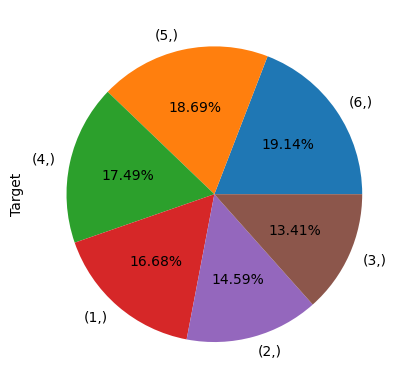

In [19]:
class_counts = y_train.value_counts()

class_counts.plot(kind='pie', autopct='%.2f%%' )
plt.ylabel('Target')  
plt.show()

#### In target column all the categories are almost equal number of size
#### so there is not any data imblance case

In [21]:
from math import ceil

In [22]:
def plot_kde_grid(X, y_train, n_cols=4, figsize=(20, 100)):
    n_features = X.shape[1]
    n_rows = ceil(n_features / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.ravel()  
    
    for idx, column in enumerate(X.columns):
        sns.kdeplot(data=X, x=column, hue=y_train, ax=axes[idx])
        axes[idx].set_title(f'Feature {column}')
        axes[idx].set_xlabel('')
    for idx in range(n_features, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()

In [23]:
def create_correlation_table(X, y_train):
    data = X.copy()
    data['target'] = y_train
    
    correlations = data.corr()['target'].sort_values(ascending=False)
    corr_df = pd.DataFrame({
        'Feature': correlations.index,
        'Correlation with Target': correlations.values
    })
    corr_df = corr_df[corr_df['Feature'] != 'target']
    print("Top 20 Positive Correlations:")
    print(corr_df.head(20))
    print("\nTop 20 Negative Correlations:")
    print(corr_df.tail(20))
    
    return corr_df

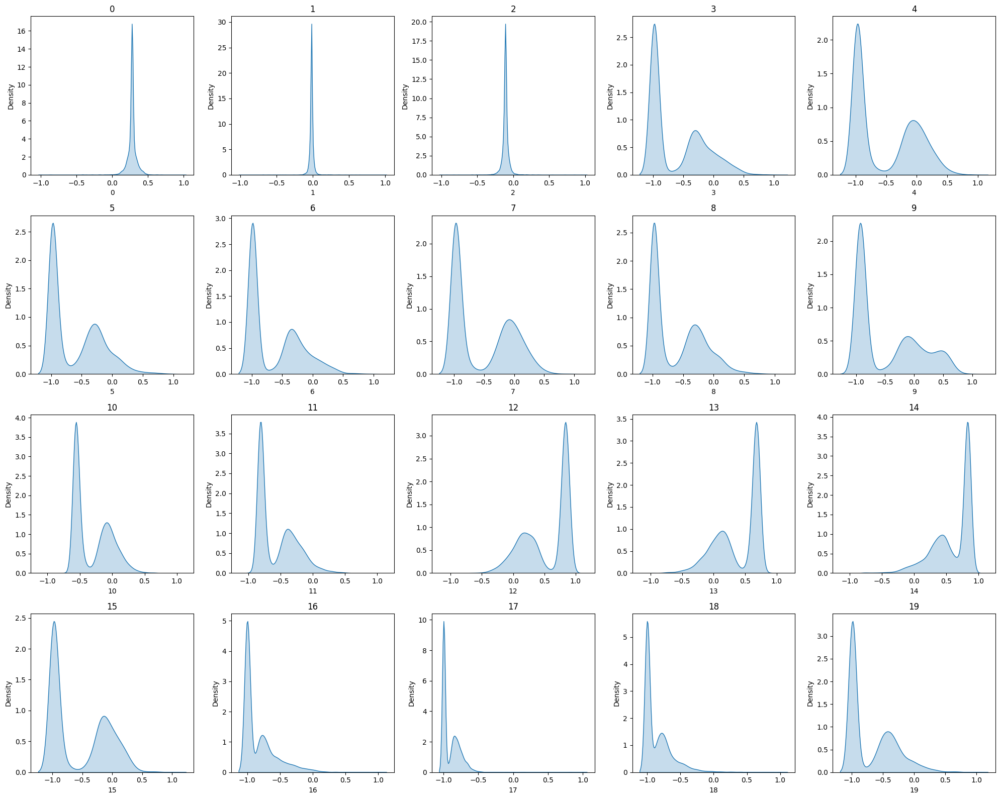

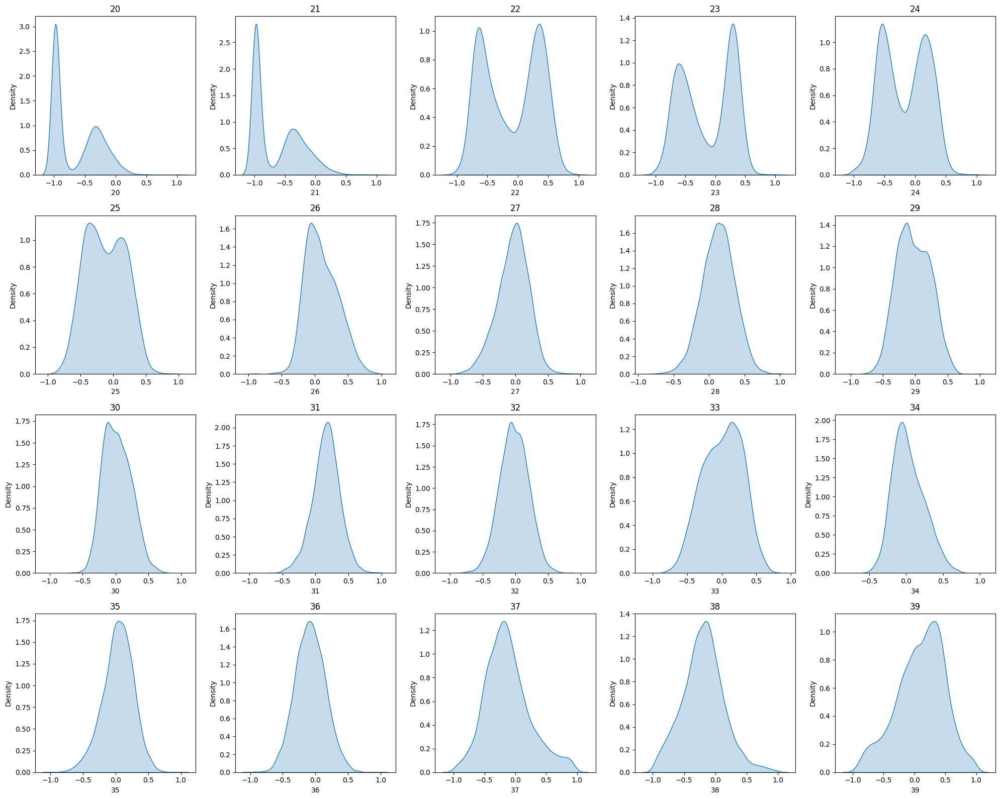

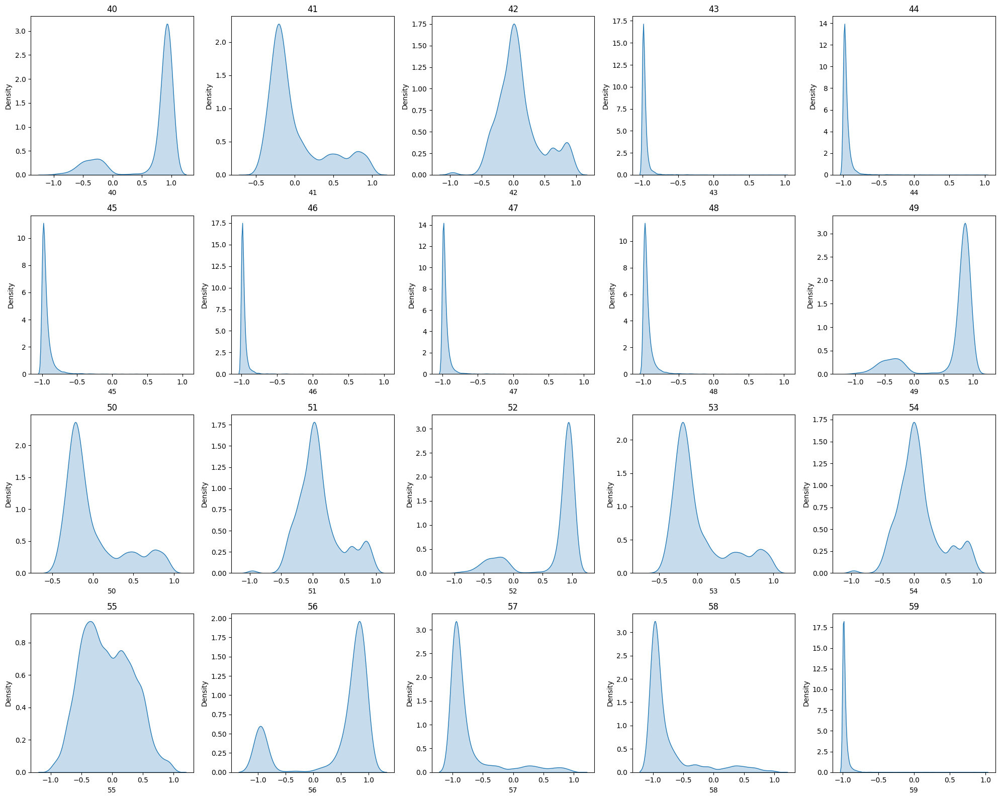

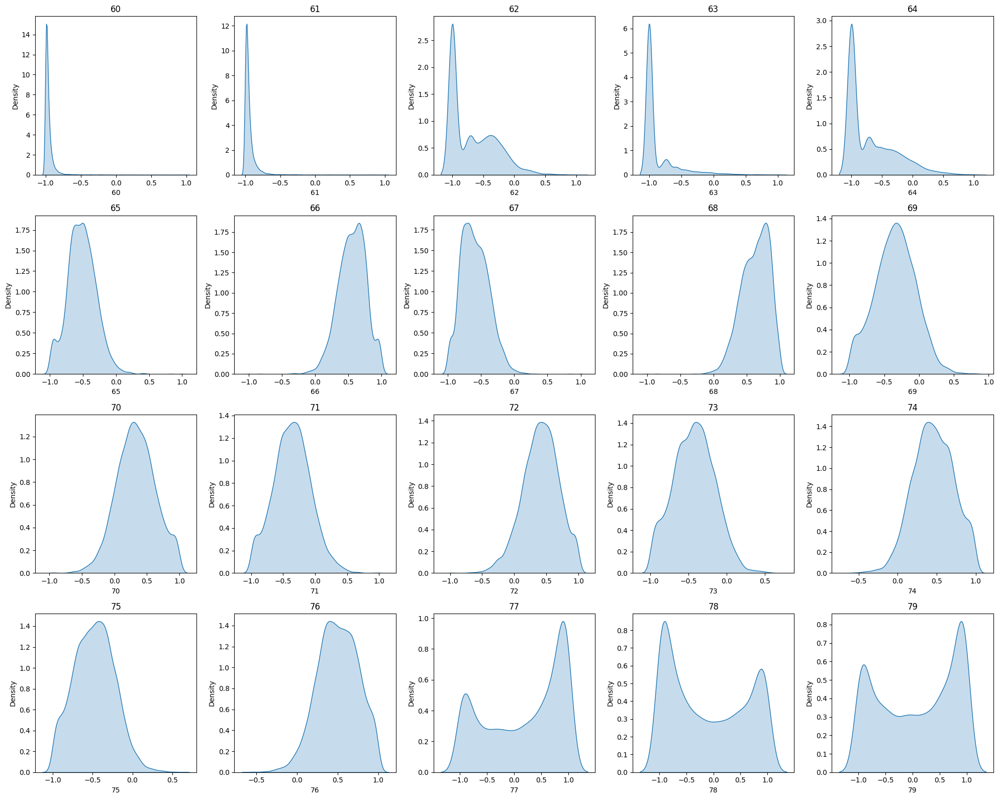

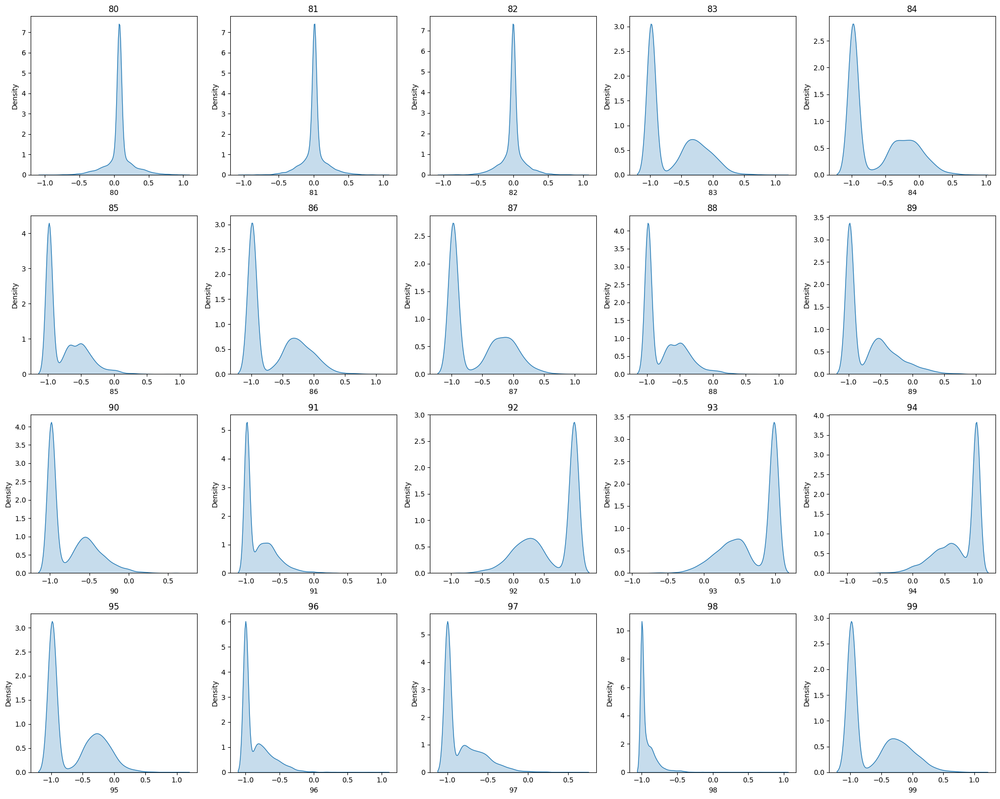

...

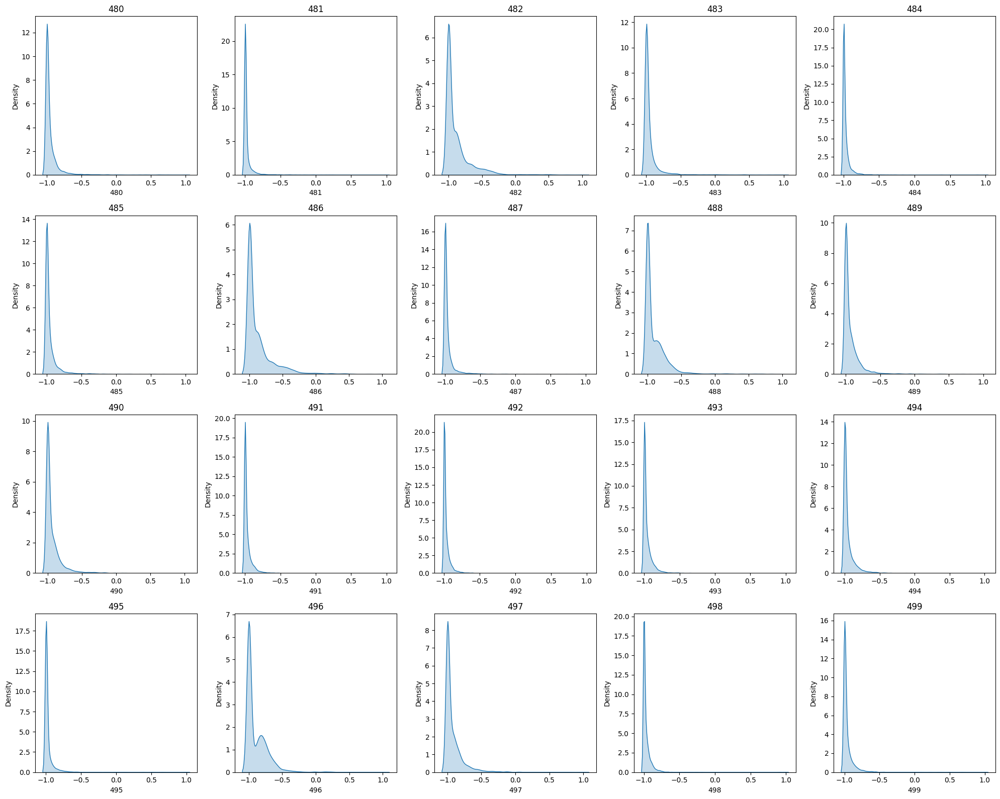

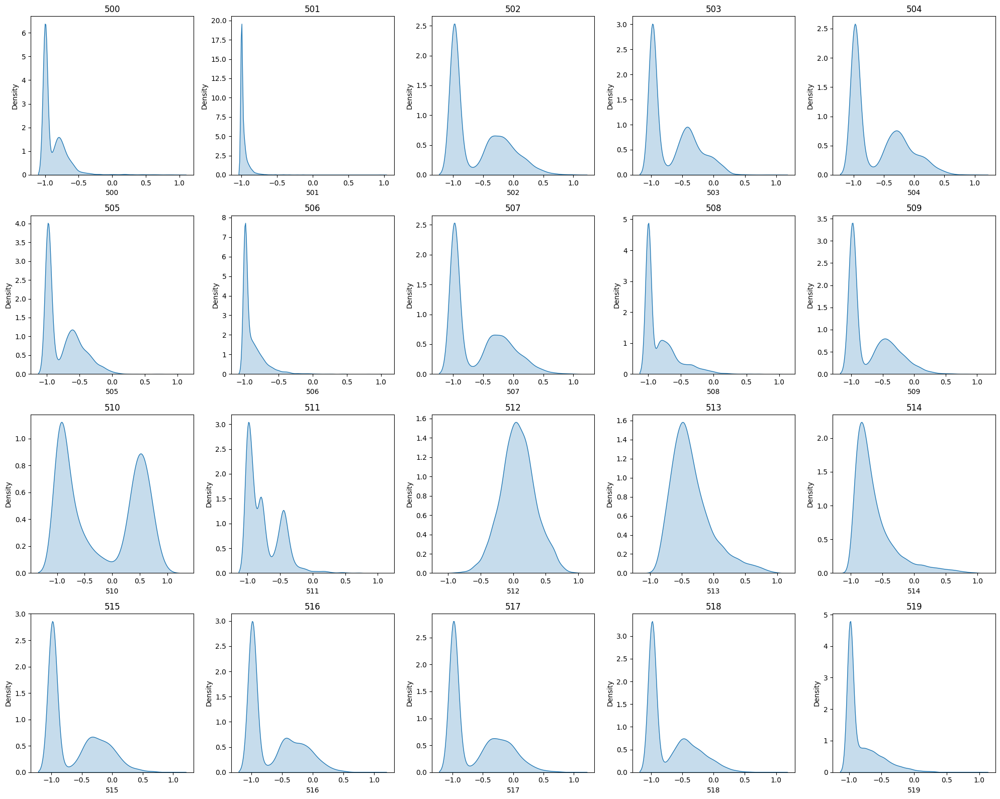

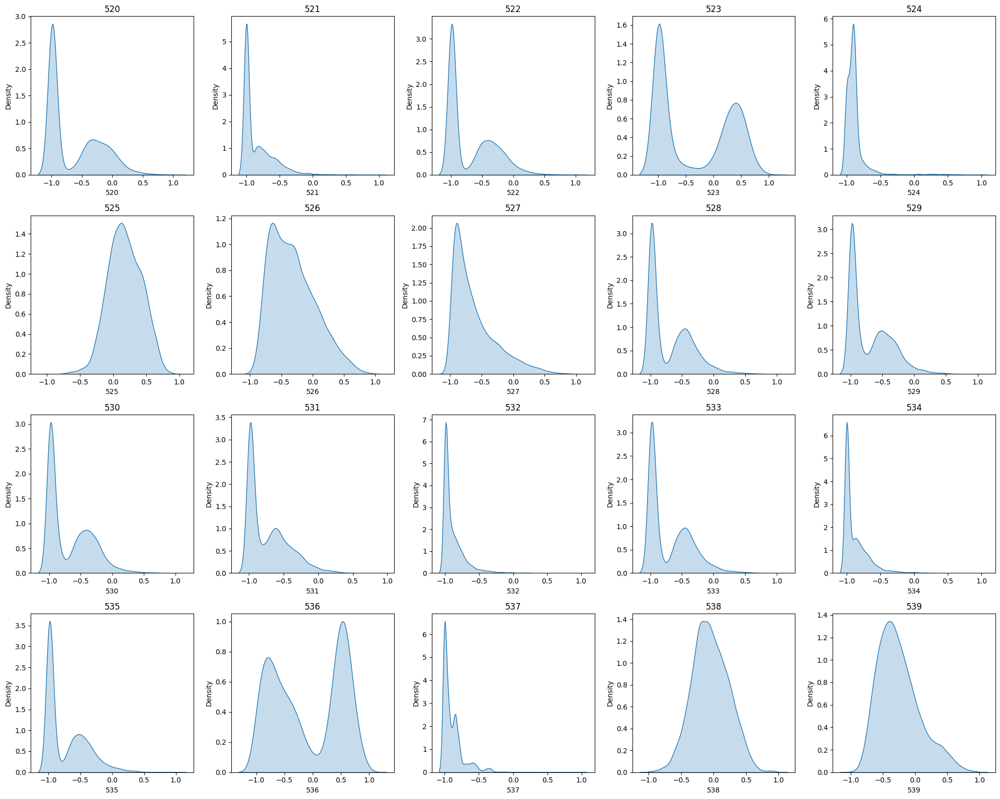

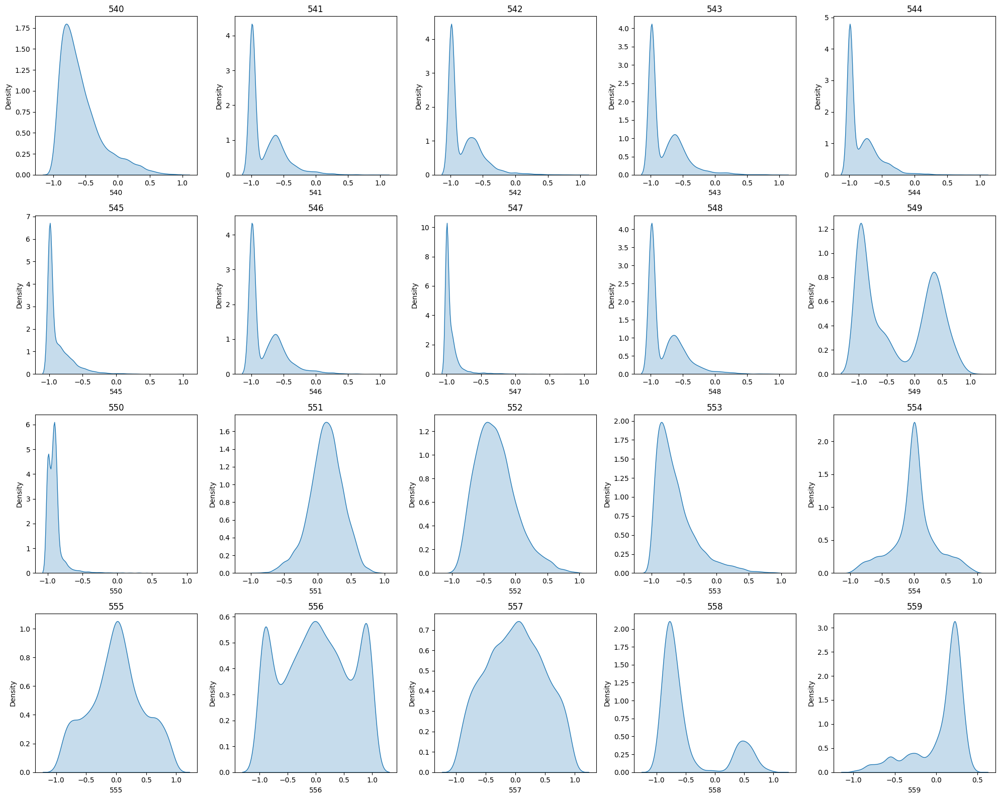

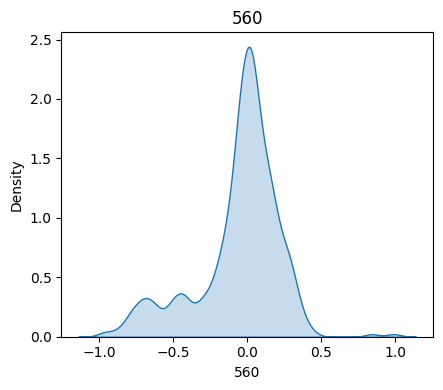

In [ ]:
cols = X_train.columns
batch_size = 20

for i in range(0, len(cols), batch_size):
    batch_cols = cols[i:i+batch_size]
    n_plots = len(batch_cols)
    n_cols_grid = 5
    n_rows_grid = (n_plots + n_cols_grid - 1) // n_cols_grid
    fig, axes = plt.subplots(n_rows_grid, n_cols_grid, figsize=(20, n_rows_grid * 4))
    if n_rows_grid == 1:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    else:
        axes = axes.flatten()

    for j, col in enumerate(batch_cols):
        sns.kdeplot(data=X_train, x=col, ax=axes[j], fill=True)
        axes[j].set_title(col)
    for ax in axes[n_plots:]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()

### Since all of the plots look normal and also the value is normalized
### so we need not to apply normalization

In [28]:
y_train

,0
0,5
1,5
2,5
3,5
4,5
...,...
7347,2
7348,2
7349,2
7350,2


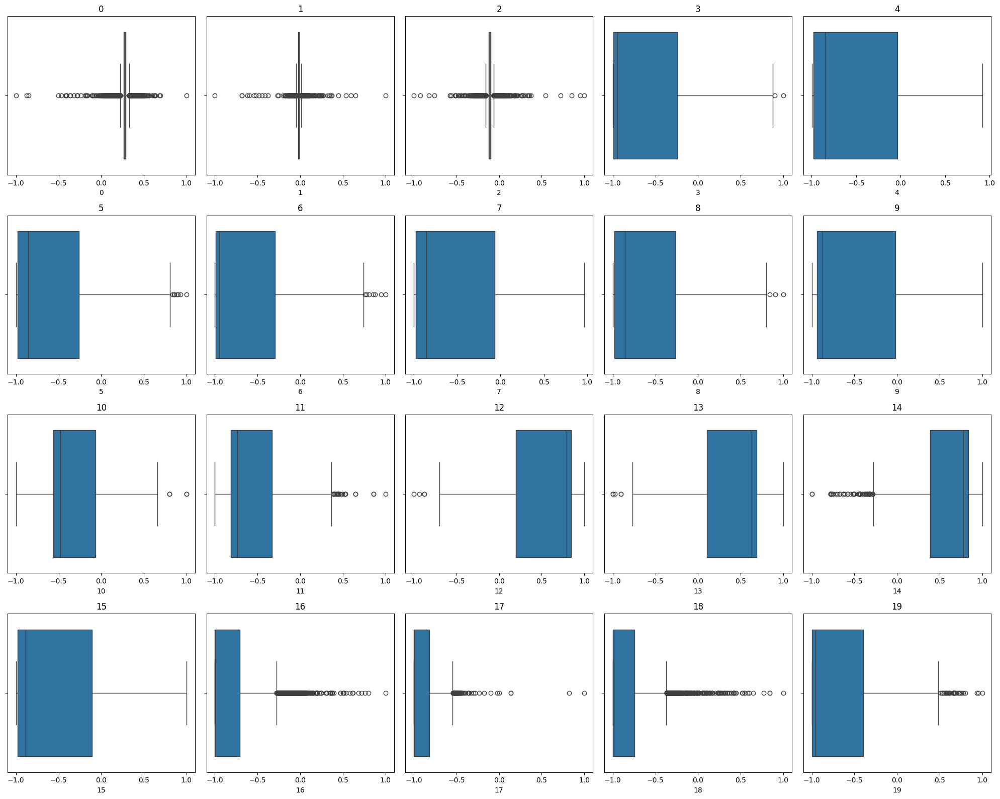

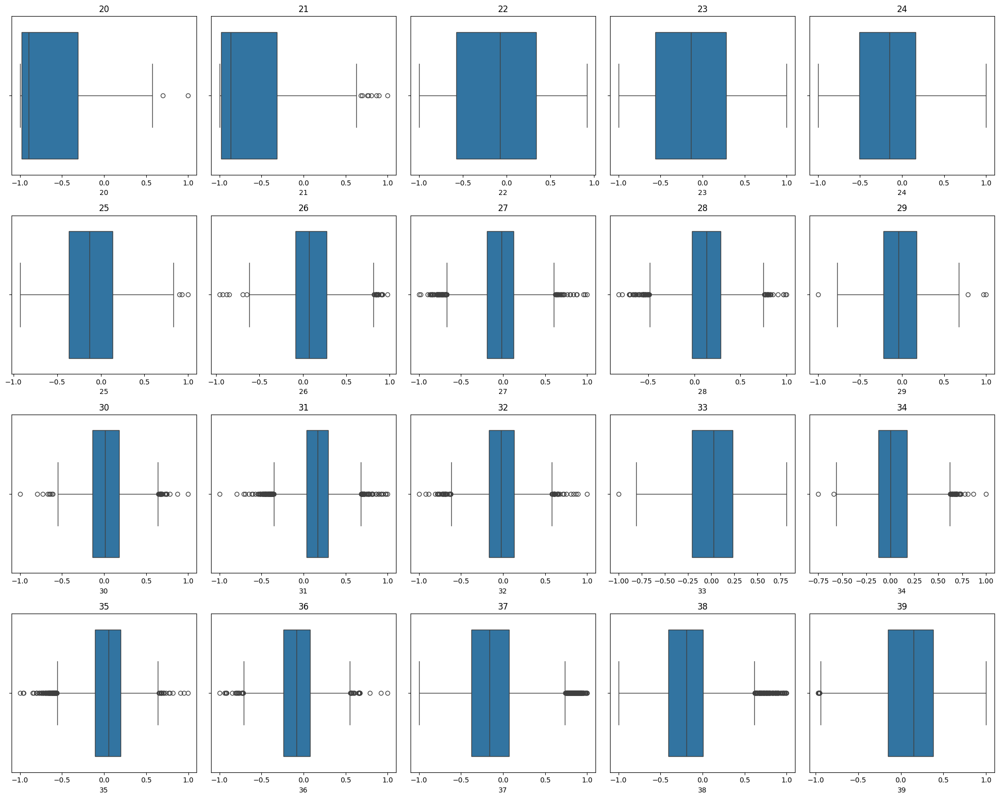

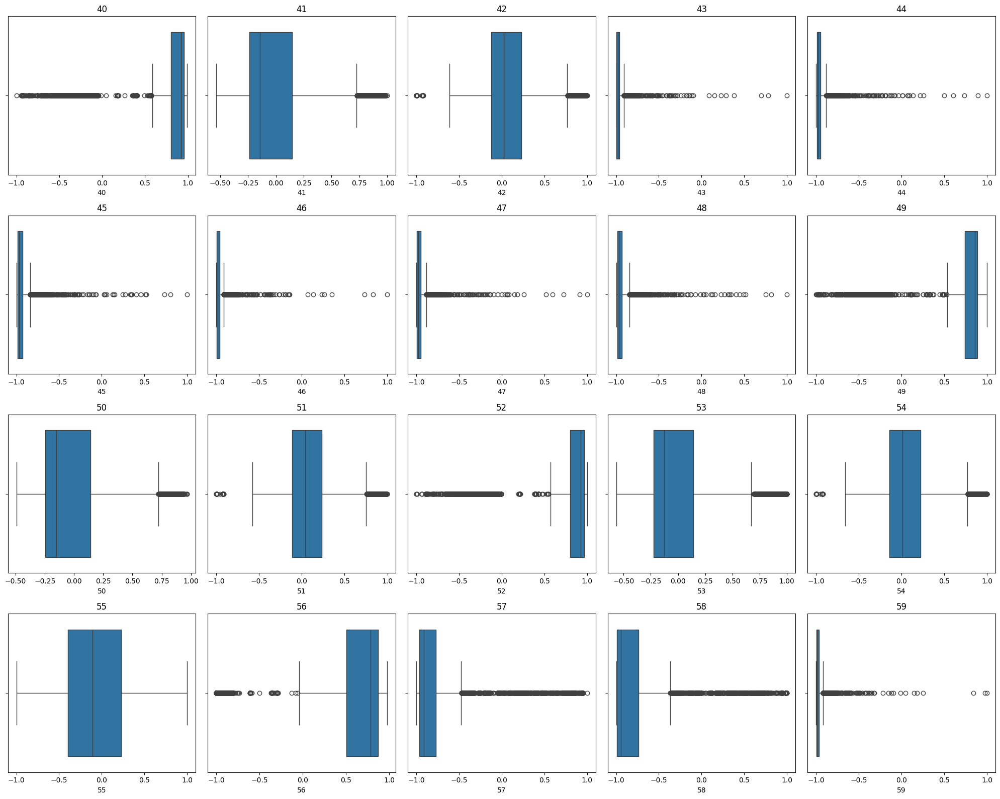

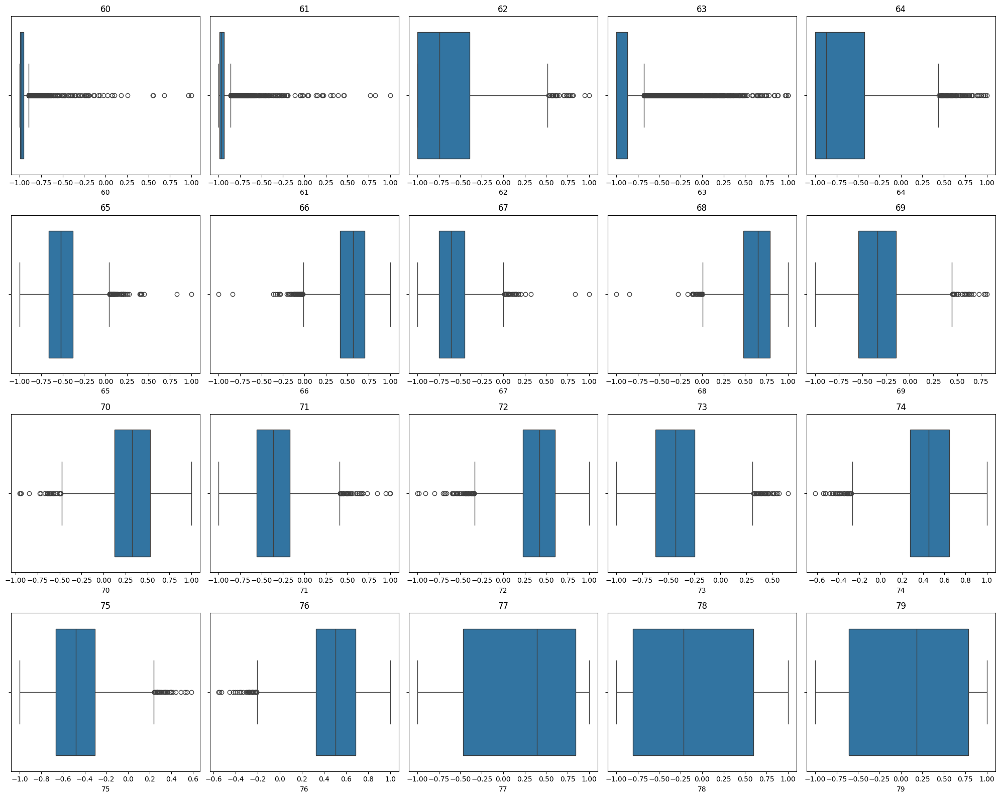

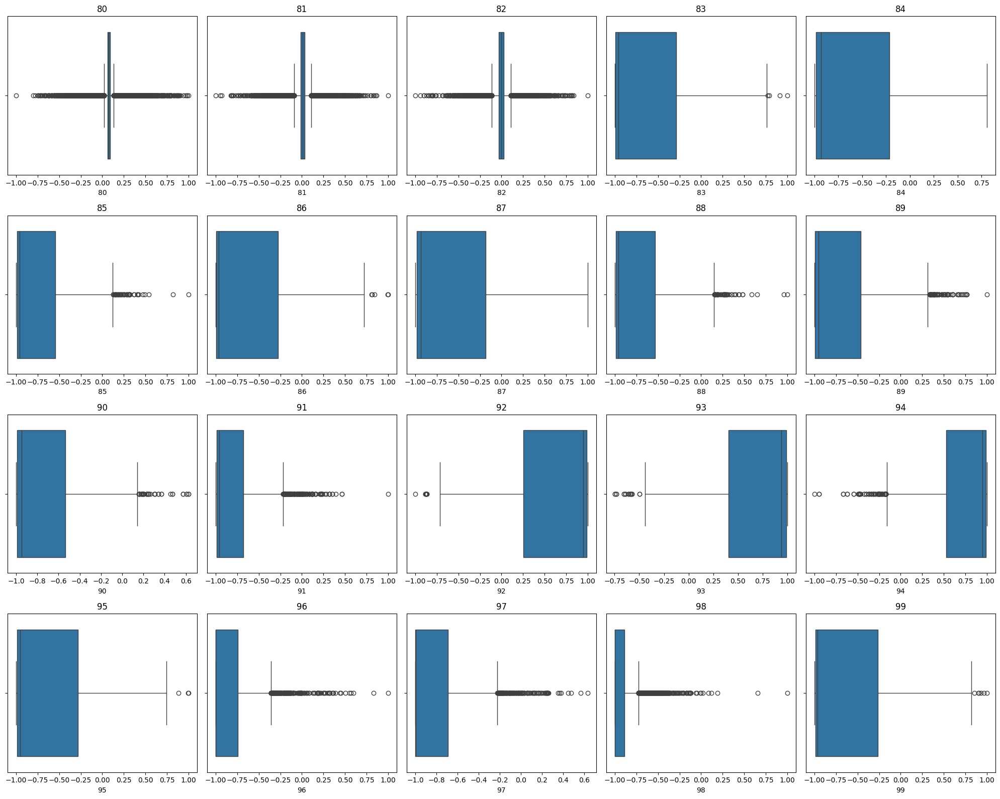

...

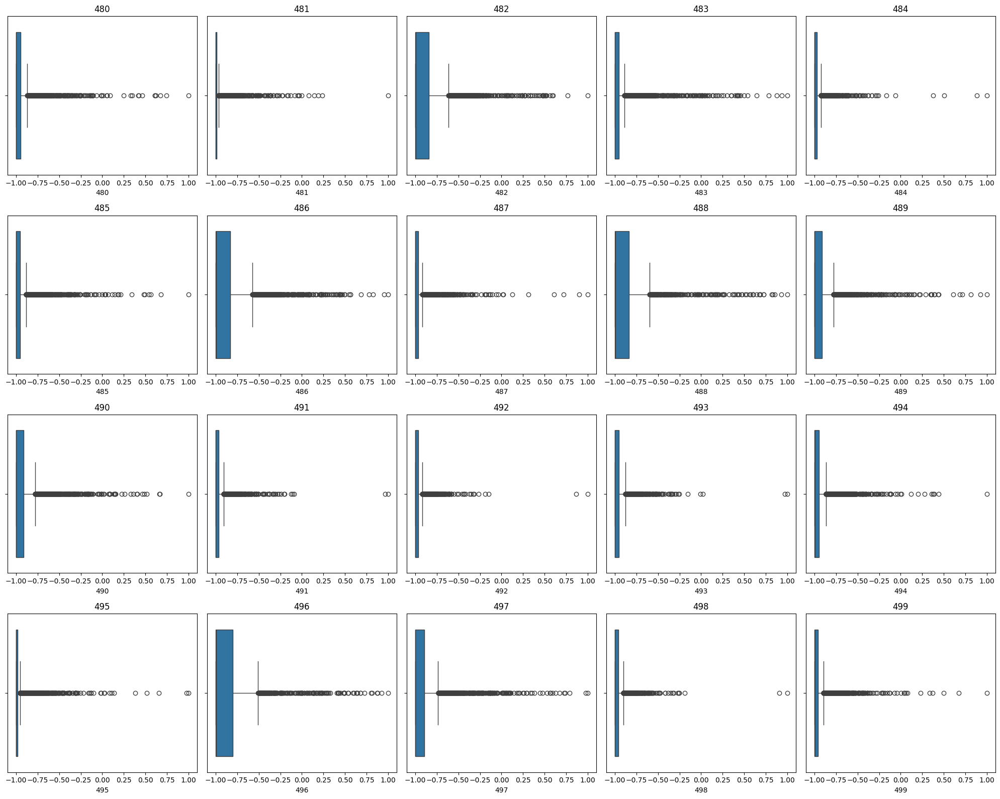

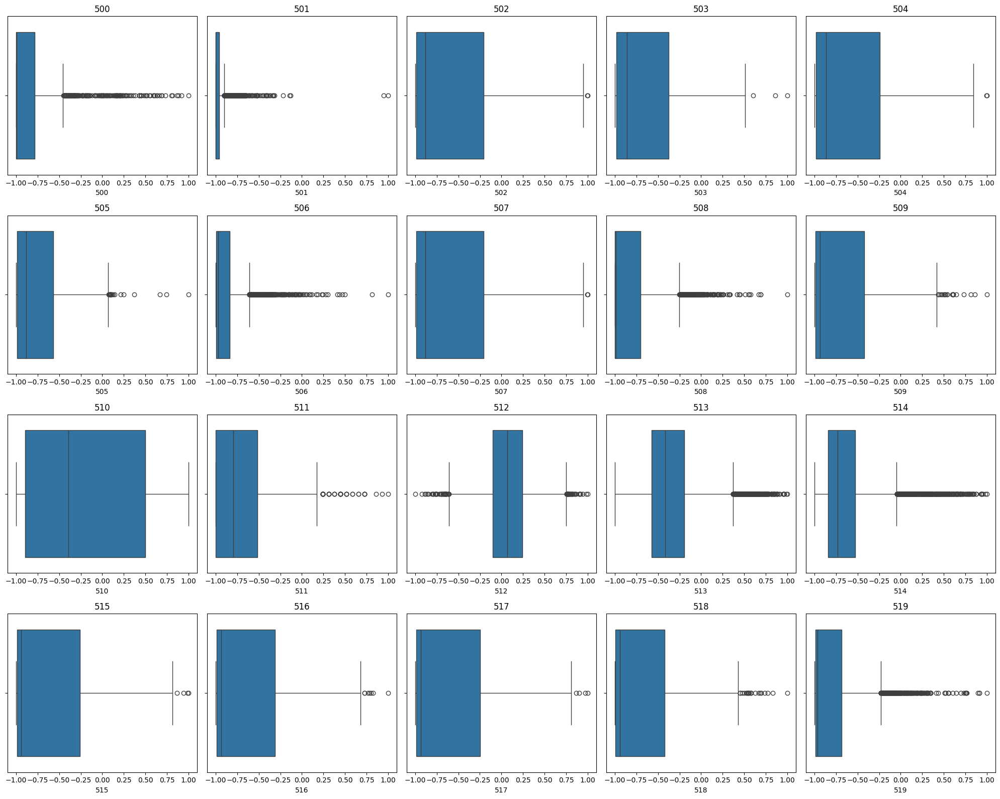

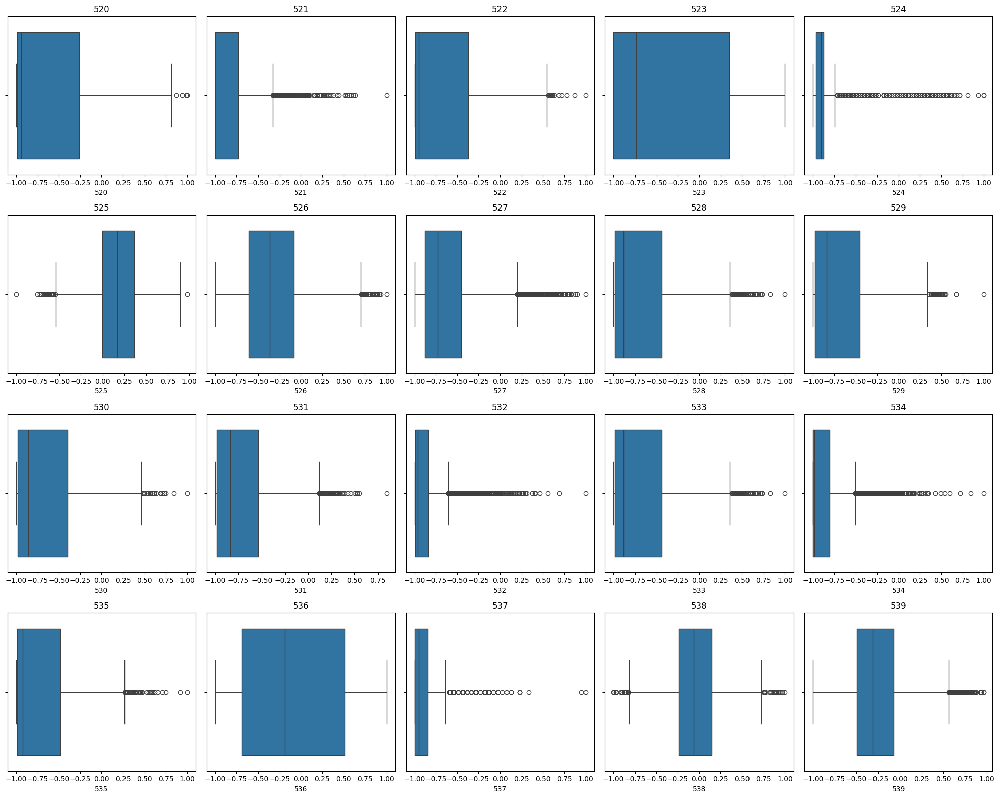

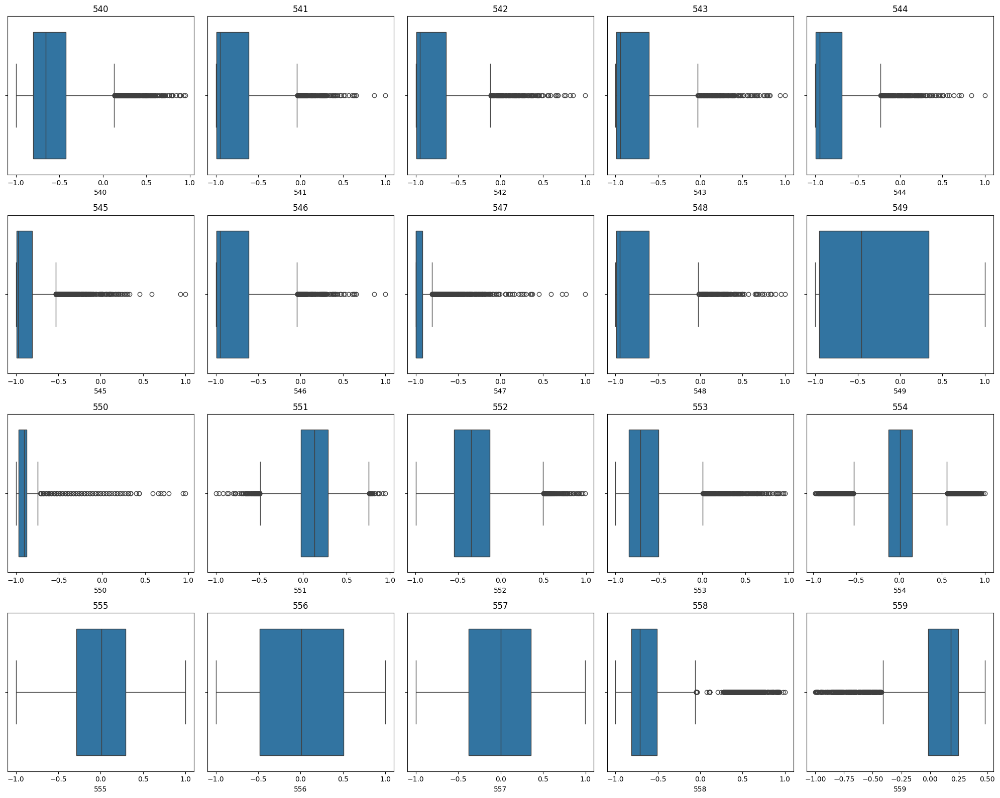

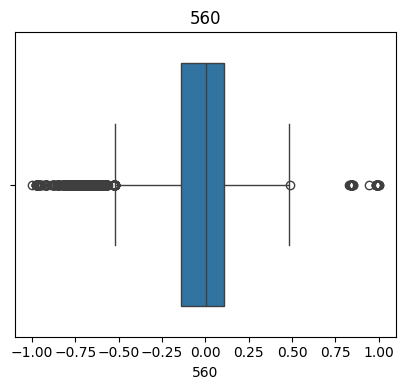

In [ ]:
cols = X_train.columns  
batch_size = 20         

for i in range(0, len(cols), batch_size):
    batch_cols = cols[i:i+batch_size]
    n_plots = len(batch_cols)
    n_cols_grid = 5
    n_rows_grid = (n_plots + n_cols_grid - 1) // n_cols_grid
    
    fig, axes = plt.subplots(n_rows_grid, n_cols_grid, figsize=(20, n_rows_grid * 4))
    if n_rows_grid == 1:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    else:
        axes = axes.flatten()

    for j, col in enumerate(batch_cols):
        sns.boxplot(x=X_train[col], ax=axes[j])
        axes[j].set_title(col)
        
    for ax in axes[n_plots:]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()


## given graph so that most of the columns have outliers

In [33]:
for col in X_train.columns:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    X_train[col] = X_train[col].clip(lower=lower_bound, upper=upper_bound)

In [35]:
#### Box plot of first 10

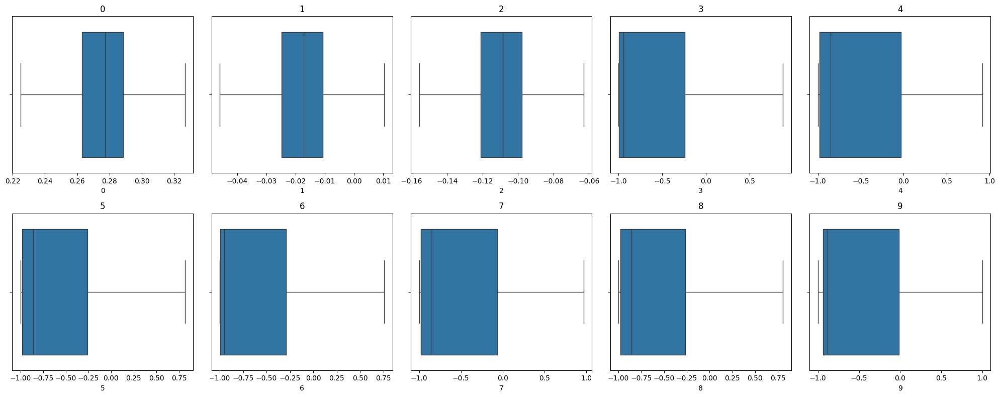

In [34]:
cols = X_train.columns
cols = cols[: 10]
batch_size = 20         

for i in range(0, len(cols), batch_size):
    batch_cols = cols[i:i+batch_size]
    n_plots = len(batch_cols)
    n_cols_grid = 5
    n_rows_grid = (n_plots + n_cols_grid - 1) // n_cols_grid
    
    fig, axes = plt.subplots(n_rows_grid, n_cols_grid, figsize=(20, n_rows_grid * 4))
    if n_rows_grid == 1:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    else:
        axes = axes.flatten()

    for j, col in enumerate(batch_cols):
        sns.boxplot(x=X_train[col], ax=axes[j])
        axes[j].set_title(col)
        
    for ax in axes[n_plots:]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()


### Box plot of last ten

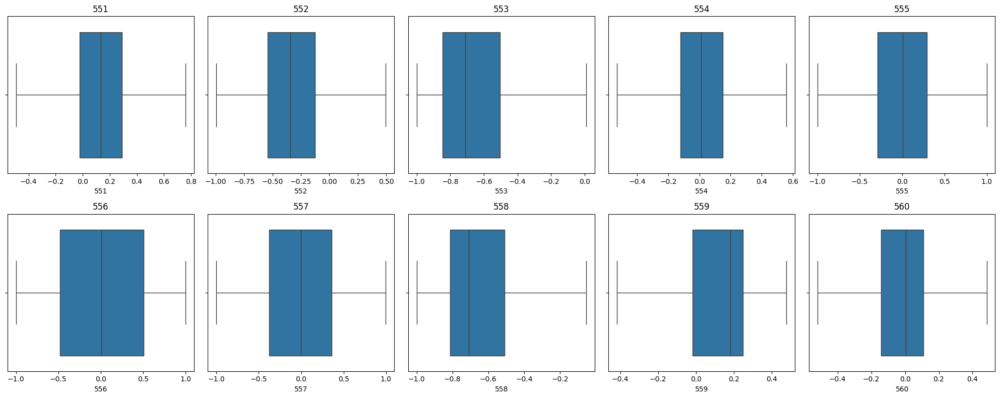

In [37]:
cols = X_train.columns
cols = cols[551:]
batch_size = 20         

for i in range(0, len(cols), batch_size):
    batch_cols = cols[i:i+batch_size]
    n_plots = len(batch_cols)
    n_cols_grid = 5
    n_rows_grid = (n_plots + n_cols_grid - 1) // n_cols_grid
    
    fig, axes = plt.subplots(n_rows_grid, n_cols_grid, figsize=(20, n_rows_grid * 4))
    if n_rows_grid == 1:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    else:
        axes = axes.flatten()

    for j, col in enumerate(batch_cols):
        sns.boxplot(x=X_train[col], ax=axes[j])
        axes[j].set_title(col)
        
    for ax in axes[n_plots:]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()


### Now there are no outliers are present in data

In [39]:
## Correlation
df_with_target = X_train.copy()
df_with_target['target'] = y_train

corr_table = df_with_target.corr()['target'].sort_values(ascending=False)

print("Correlation of each feature with y_train:")
print(corr_table)

Correlation of each feature with y_train:
target    1.000000
93        0.790783
92        0.786444
13        0.772096
134       0.762726
            ...   
234      -0.847651
103      -0.853425
367      -0.853579
102      -0.857454
104      -0.859450
Name: target, Length: 562, dtype: float64


In [42]:
plt.figure(figsize=(100, 80))
sns.barplot(x=corr_table.index, y=corr_table.values)
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation with Target")
plt.title("Correlation of Each Feature with y_train")

plt.tight_layout()
plt.show()

- It show that there are most of the column which are not dependent on the target column
- so we can drop them

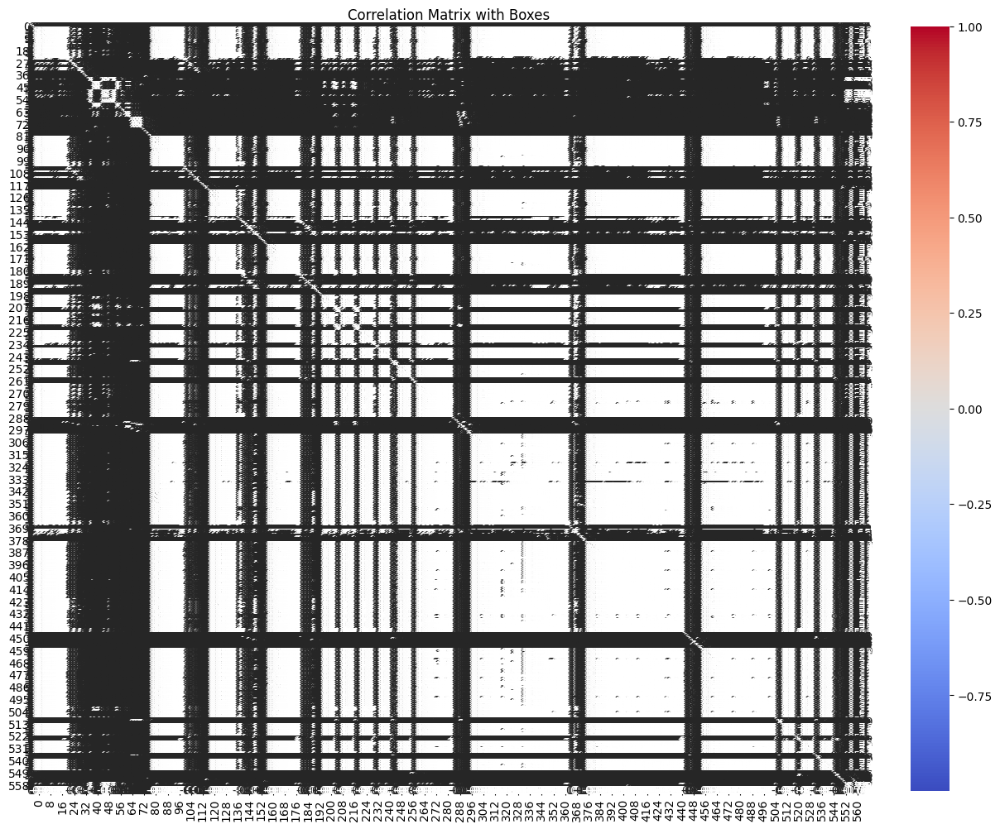

In [43]:
corr_matrix = df_with_target.corr()

plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", 
            linewidths=0.5, linecolor='black')
plt.title("Correlation Matrix with Boxes")
plt.show()